In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import OneHotEncoder

In [3]:
df  = pd.read_csv("Churn.csv")
df.head()

,Unnamed: 0,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,...,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,1,KS,area_code_415,128,yes,25,no,10.0,3,2.70,...,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,2,OH,area_code_415,107,yes,26,no,13.7,3,3.70,...,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
2,3,NJ,area_code_415,137,no,0,no,12.2,5,3.29,...,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
3,4,OH,area_code_408,84,no,0,yes,6.6,7,1.78,...,71,50.9,61.9,88,5.26,196.9,89,8.86,2,no
4,5,OK,area_code_415,75,no,0,yes,10.1,3,2.73,...,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no


In [4]:
df1 =  df.copy()

In [5]:
df1.drop('Unnamed: 0', axis = 1, inplace=True)

In [6]:
df1.head()

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
0,KS,area_code_415,128,yes,25,no,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1,no
1,OH,area_code_415,107,yes,26,no,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1,no
2,NJ,area_code_415,137,no,0,no,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0,no
3,OH,area_code_408,84,no,0,yes,6.6,7,1.78,299.4,71,50.9,61.9,88,5.26,196.9,89,8.86,2,no
4,OK,area_code_415,75,no,0,yes,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3,no


In [7]:
df1.dtypes

state              object
area.code          object
account.length      int64
voice.plan         object
voice.messages      int64
intl.plan          object
intl.mins         float64
intl.calls          int64
intl.charge       float64
day.mins          float64
day.calls           int64
day.charge         object
eve.mins           object
eve.calls           int64
eve.charge        float64
night.mins        float64
night.calls         int64
night.charge      float64
customer.calls      int64
churn              object
dtype: object

In [8]:
df1.isnull().sum()

state             0
area.code         0
account.length    0
voice.plan        0
voice.messages    0
intl.plan         0
intl.mins         0
intl.calls        0
intl.charge       0
day.mins          0
day.calls         0
day.charge        0
eve.mins          0
eve.calls         0
eve.charge        0
night.mins        0
night.calls       0
night.charge      0
customer.calls    0
churn             0
dtype: int64

##### But!!

In [9]:
df1.loc[12:12,:]

,state,area.code,account.length,voice.plan,voice.messages,intl.plan,intl.mins,intl.calls,intl.charge,day.mins,day.calls,day.charge,eve.mins,eve.calls,eve.charge,night.mins,night.calls,night.charge,customer.calls,churn
12,IA,area_code_408,168,no,0,no,11.2,2,3.02,128.8,96,Nan,104.9,71,8.92,141.1,128,6.35,1,no


In [10]:
x = np.nan
print(x)

nan


In [11]:
type(x)

float

In [12]:
x = np.NaN
print(x)

nan


In [13]:
type(x)

float

In [14]:
df1.duplicated().sum()

0

In [15]:
df1.columns

Index(['state', 'area.code', 'account.length', 'voice.plan', 'voice.messages',
       'intl.plan', 'intl.mins', 'intl.calls', 'intl.charge', 'day.mins',
       'day.calls', 'day.charge', 'eve.mins', 'eve.calls', 'eve.charge',
       'night.mins', 'night.calls', 'night.charge', 'customer.calls', 'churn'],
      dtype='object')

In [16]:
columns_to_change = ['area.code', 'account.length', 'voice.plan',
       'voice.messages', 'intl.plan', 'intl.mins', 'intl.calls', 'intl.charge',
       'day.mins', 'day.calls', 'day.charge', 'eve.mins', 'eve.calls',
      'eve.charge', 'night.mins', 'night.calls', 'night.charge',
      'customer.calls']

In [17]:
df1.rename(columns=lambda x: x.replace('.', '_'), inplace=True)

In [18]:
df1['day_charge'] = pd.to_numeric(df1.day_charge,errors = 'coerce')

In [19]:
df1['eve_mins'] = pd.to_numeric(df1.eve_mins,errors = 'coerce' )

In [20]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 20 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   state           5000 non-null   object 
 1   area_code       5000 non-null   object 
 2   account_length  5000 non-null   int64  
 3   voice_plan      5000 non-null   object 
 4   voice_messages  5000 non-null   int64  
 5   intl_plan       5000 non-null   object 
 6   intl_mins       5000 non-null   float64
 7   intl_calls      5000 non-null   int64  
 8   intl_charge     5000 non-null   float64
 9   day_mins        5000 non-null   float64
 10  day_calls       5000 non-null   int64  
 11  day_charge      4993 non-null   float64
 12  eve_mins        4976 non-null   float64
 13  eve_calls       5000 non-null   int64  
 14  eve_charge      5000 non-null   float64
 15  night_mins      5000 non-null   float64
 16  night_calls     5000 non-null   int64  
 17  night_charge    5000 non-null   f

In [21]:
df1[df1.day_charge.isna()].head(2)

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
12,IA,area_code_408,168,no,0,no,11.2,2,3.02,128.8,96,NaN,104.9,71,8.92,141.1,128,6.35,1,no
27,MT,area_code_408,54,no,0,no,14.7,4,3.97,134.3,73,NaN,155.5,100,13.22,102.1,68,4.59,3,no


In [22]:
df1[df1.eve_mins.isna()].head(2)

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
89,NJ,area_code_415,128,no,0,no,13.9,4,3.75,237.9,125,40.44,NaN,93,21.05,208.9,68,9.4,1,yes
102,VT,area_code_415,135,no,0,no,10.5,6,2.84,151.7,82,25.79,NaN,105,10.12,180.0,100,8.1,0,no


In [23]:
df1.isnull().sum()

state              0
area_code          0
account_length     0
voice_plan         0
voice_messages     0
intl_plan          0
intl_mins          0
intl_calls         0
intl_charge        0
day_mins           0
day_calls          0
day_charge         7
eve_mins          24
eve_calls          0
eve_charge         0
night_mins         0
night_calls        0
night_charge       0
customer_calls     0
churn              0
dtype: int64

In [24]:
df1.describe(include='all')

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
count,5000,5000,5000.00000,5000,5000.000000,5000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,4993.000000,4976.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000
unique,51,3,NaN,2,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
top,WV,area_code_415,NaN,no,NaN,no,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,no
freq,158,2495,NaN,3677,NaN,4527,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4293
mean,NaN,NaN,100.25860,NaN,7.755200,NaN,10.261780,4.435200,2.771196,180.288900,100.029400,30.653501,200.580326,100.191000,17.054322,200.391620,99.919200,9.017732,1.570400,NaN
std,NaN,NaN,39.69456,NaN,13.546393,NaN,2.761396,2.456788,0.745514,53.894699,19.831197,9.166356,50.554637,19.826496,4.296843,50.527789,19.958686,2.273763,1.306363,NaN
min,NaN,NaN,1.00000,NaN,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
25%,NaN,NaN,73.00000,NaN,0.000000,NaN,8.500000,3.000000,2.300000,143.700000,87.000000,24.430000,166.275000,87.000000,14.140000,166.900000,87.000000,7.510000,1.000000,NaN
50%,NaN,NaN,100.00000,NaN,0.000000,NaN,10.300000,4.000000,2.780000,180.100000,100.000000,30.620000,201.000000,100.000000,17.090000,200.400000,100.000000,9.020000,1.000000,NaN
75%,NaN,NaN,127.00000,NaN,17.000000,NaN,12.000000,6.000000,3.240000,216.200000,113.000000,36.750000,234.100000,114.000000,19.900000,234.700000,113.000000,10.560000,2.000000,NaN


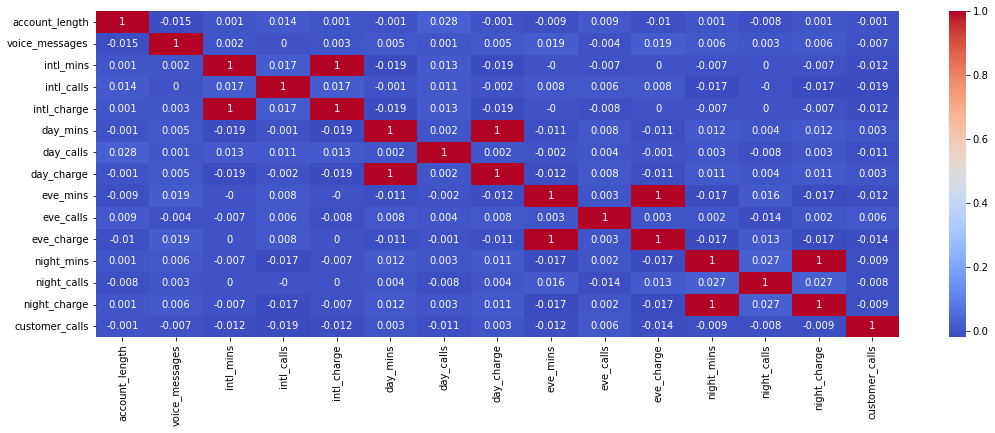

In [25]:
plt.figure(figsize=(18,6))
sns.heatmap(round(df1.corr(),3),annot = True, fmt = '.2g', cmap = 'coolwarm')
plt.show()

C:\Users\sneha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


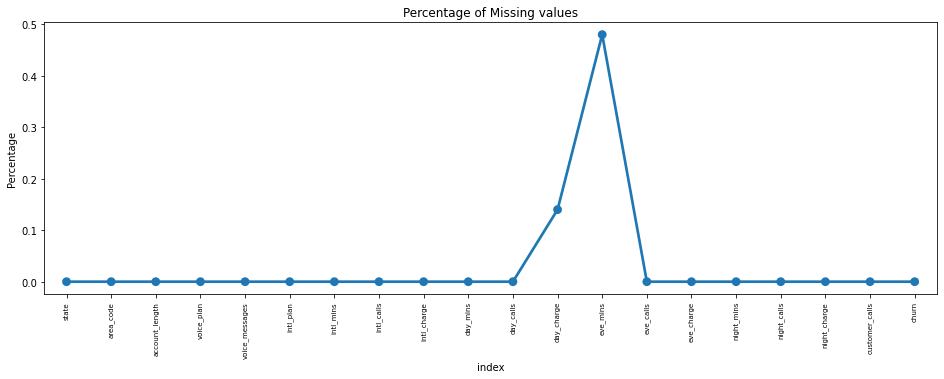

In [26]:
missing = pd.DataFrame(df1.isnull().sum()*100/df1.shape[0]).reset_index()
plt.figure(figsize=(16,5))
ax = sns.pointplot('index',0,data=missing)
plt.xticks(rotation=90,fontsize=7)
plt.title('Percentage of Missing values')
plt.ylabel('Percentage')
plt.show()

In [27]:
df1.dropna(inplace=True)

In [28]:
df1.shape

(4969, 20)

In [29]:
df1.churn.value_counts()

no     4264
yes     705
Name: churn, dtype: int64

Text(0.5, 1.0, 'Pie Chart For Churn')

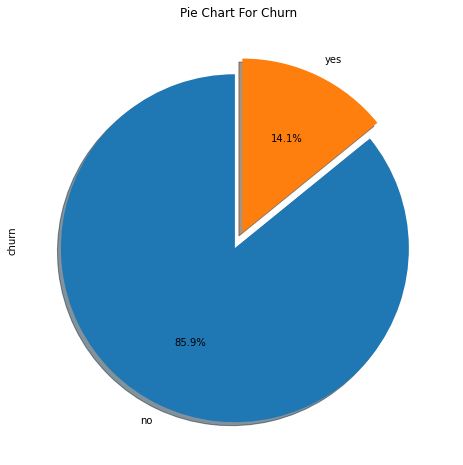

In [30]:
#To analyse the churn we will draw a pie plot 
df['churn'].value_counts().plot.pie(explode=[0.05,0.05],autopct = '%1.1f%%',startangle=90,shadow=True,figsize=(8,8))
plt.title('Pie Chart For Churn')

### this value count shows data is imbalanced, churners ratio
1) 84:14

#### Separating numeric and categorical columns

In [31]:
numeric_data = df1.select_dtypes(include=np.number)
numeric_cols = numeric_data.columns
numeric_data

,account_length,voice_messages,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls
0,128,25,10.0,3,2.70,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,1
1,107,26,13.7,3,3.70,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,1
2,137,0,12.2,5,3.29,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,0
3,84,0,6.6,7,1.78,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,2
4,75,0,10.1,3,2.73,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,50,40,9.9,5,2.67,235.7,127,40.07,223.0,126,18.96,297.5,116,13.39,2
4996,152,0,14.7,2,3.97,184.2,90,31.31,256.8,73,21.83,213.6,113,9.61,3
4997,61,0,13.6,4,3.67,140.6,89,23.90,172.8,128,14.69,212.4,97,9.56,1
4998,109,0,8.5,6,2.30,188.8,67,32.10,171.7,92,14.59,224.4,89,10.10,0


In [32]:
categoric_data = df1.select_dtypes(exclude = np.number)
categoric_cols = categoric_data.columns
categoric_data

,state,area_code,voice_plan,intl_plan,churn
0,KS,area_code_415,yes,no,no
1,OH,area_code_415,yes,no,no
2,NJ,area_code_415,no,no,no
3,OH,area_code_408,no,yes,no
4,OK,area_code_415,no,yes,no
...,...,...,...,...,...
4995,HI,area_code_408,yes,no,no
4996,WV,area_code_415,no,no,yes
4997,DC,area_code_415,no,no,no
4998,DC,area_code_510,no,no,no


### Identifying outliers

### account_length

C:\Users\sneha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='account_length'>

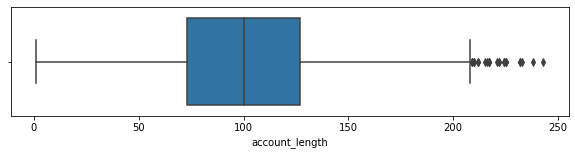

In [33]:
plt.figure(figsize=(10,2))
sns.boxplot(numeric_data.account_length)

In [34]:
df1.account_length.describe()

count    4969.000000
mean      100.206681
std        39.695476
min         1.000000
25%        73.000000
50%       100.000000
75%       127.000000
max       243.000000
Name: account_length, dtype: float64

In [35]:
print(numeric_data.account_length.quantile(0.99))

194.0


In [36]:
print('The no. of rows more than 99 percentile:',len(numeric_data[numeric_data.account_length>194]))

The no. of rows more than 99 percentile: 47


In [37]:
df1[df1.account_length>df1.account_length.quantile(0.99)].sort_values(by='account_length',ascending =False).head(5)

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
817,UT,area_code_510,243,no,0,no,6.6,6,1.78,95.5,92,16.24,163.7,63,13.91,264.2,118,11.89,2,no
4260,WA,area_code_415,238,no,0,no,12.0,1,3.24,202.0,60,34.34,213.9,105,18.18,266.4,90,11.99,2,no
4395,IL,area_code_408,233,no,0,no,9.8,4,2.65,137.3,94,23.34,232.4,87,19.75,206.0,105,9.27,1,no
1408,NM,area_code_408,232,no,0,no,11.8,3,3.19,165.6,104,28.15,195.9,115,16.65,118.3,77,5.32,1,no
4389,HI,area_code_415,232,no,0,no,10.0,6,2.70,248.2,128,42.19,211.2,96,17.95,147.1,117,6.62,2,no


In [38]:
iqr = df1.account_length.quantile(0.75) - df1.account_length.quantile(0.25)
account_length_outliers = df1.account_length.quantile(0.75) + (iqr*1.5)
account_length_outliers

208.0

In [39]:
print('The no. of rows after outliers are:',len(numeric_data[numeric_data.account_length>208]))

The no. of rows after outliers are: 24


### Voice_messages

C:\Users\sneha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='voice_messages'>

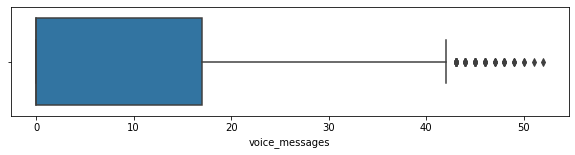

In [40]:
plt.figure(figsize=(10,2))
sns.boxplot(numeric_data.voice_messages)

In [41]:
df1.voice_messages.describe()

count    4969.000000
mean        7.754880
std        13.545738
min         0.000000
25%         0.000000
50%         0.000000
75%        17.000000
max        52.000000
Name: voice_messages, dtype: float64

In [42]:
print(df1.voice_messages.quantile(0.99))

43.0


In [43]:
print('The no.of rows more than 99 percentile : ', len(numeric_data[numeric_data.voice_messages>43]))

The no.of rows more than 99 percentile :  44


In [44]:
df1[df1.voice_messages>df1.voice_messages.quantile(0.99)].sort_values(by='voice_messages',ascending =False).head(5)

,state,area_code,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,eve_mins,eve_calls,eve_charge,night_mins,night_calls,night_charge,customer_calls,churn
4713,UT,area_code_408,118,yes,52,yes,7.9,3,2.13,123.7,114,21.03,133.2,137,11.32,191.8,102,8.63,0,no
845,FL,area_code_415,144,yes,51,no,10.0,4,2.70,283.9,98,48.26,192.0,109,16.32,196.3,85,8.83,1,no
2887,OR,area_code_415,134,yes,50,no,11.1,4,3.00,208.8,130,35.50,132.9,104,11.30,136.7,107,6.15,2,no
2716,WV,area_code_510,137,yes,50,no,12.1,4,3.27,186.5,94,31.71,178.0,106,15.13,215.6,100,9.70,2,no
3524,VA,area_code_415,71,yes,49,no,7.8,4,2.11,174.0,122,29.58,168.6,85,14.33,132.1,120,5.94,1,no


In [45]:
iqr = df1.voice_messages.quantile(0.75) - df1.voice_messages.quantile(0.25)
voice_messages_outliers = df1.voice_messages.quantile(0.75) + (iqr*1.5)
voice_messages_outliers

42.5

In [46]:
print('The no. of rows after outliers are:',len(numeric_data[numeric_data.voice_messages>42.5]))

The no. of rows after outliers are: 60


### intl_mins

C:\Users\sneha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='intl_mins'>

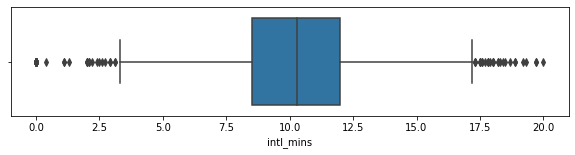

In [47]:
plt.figure(figsize=(10,2))
sns.boxplot(numeric_data.intl_mins)

In [48]:
df1.intl_mins.describe()

count    4969.000000
mean       10.264198
std         2.761996
min         0.000000
25%         8.500000
50%        10.300000
75%        12.000000
max        20.000000
Name: intl_mins, dtype: float64

In [49]:
print(df1.intl_mins.quantile(0.99))

16.6


In [50]:
print('The no.of rows more than 99 percentile : ', len(numeric_data[numeric_data.intl_mins>16.6]))

The no.of rows more than 99 percentile :  48


In [51]:
iqr = df1.intl_mins.quantile(0.75) - df1.intl_mins.quantile(0.25)
intl_mins_outliers1 = df1.intl_mins.quantile(0.75) + (iqr*1.5)
intl_mins_outliers1

17.25

In [52]:
intl_mins_outliers0 = df1.intl_mins.quantile(0.25) - (iqr*1.5)
intl_mins_outliers0

3.25

In [53]:
x = len(numeric_data.loc[(numeric_data['intl_mins']<2.5) | (numeric_data['intl_mins']>17.25)])
print(x)

64


### intl_calls

C:\Users\sneha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='intl_calls'>

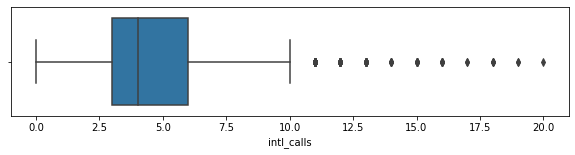

In [54]:
plt.figure(figsize=(10,2))
sns.boxplot(numeric_data.intl_calls)

In [55]:
df1.intl_calls.describe()

count    4969.000000
mean        4.433085
std         2.459495
min         0.000000
25%         3.000000
50%         4.000000
75%         6.000000
max        20.000000
Name: intl_calls, dtype: float64

In [56]:
print(numeric_data.intl_calls.quantile(0.99))

12.319999999999709


In [57]:
print('The no. of Rows having value more than 12.31:',len(numeric_data[numeric_data.intl_calls>12.31]))

The no. of Rows having value more than 12.31: 50


In [58]:
iqr = df1.intl_calls.quantile(0.75) - df1.intl_calls.quantile(0.25)
intl_calls_outliers = df1.intl_calls.quantile(0.75)+(iqr*1.5)
intl_calls_outliers

10.5

In [59]:
print('The no. of rows after outlier are:',len(numeric_data[numeric_data.intl_calls>10.5]))

The no. of rows after outlier are: 118


### intl_charge

C:\Users\sneha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='intl_charge'>

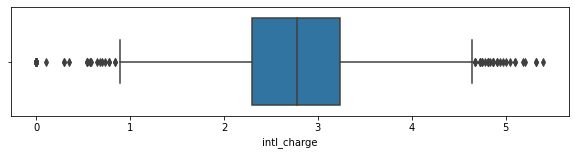

In [60]:
plt.figure(figsize=(10,2))
sns.boxplot(numeric_data.intl_charge)

In [61]:
df1.intl_charge.describe()

count    4969.000000
mean        2.771851
std         0.745672
min         0.000000
25%         2.300000
50%         2.780000
75%         3.240000
max         5.400000
Name: intl_charge, dtype: float64

In [62]:
print(numeric_data.intl_charge.quantile(0.99))

4.48


In [63]:
print('The number of rows have value more than 4.48 are:',len(numeric_data[numeric_data.intl_charge>4.48]))

The number of rows have value more than 4.48 are: 48


In [64]:
iqr = df1.intl_charge.quantile(0.75) - df1.intl_charge.quantile(0.25)
intl_charge_outliers1 = df1.intl_charge.quantile(0.75) + (iqr*1.5)
intl_charge_outliers1

4.65

In [65]:
intl_charge_outliers0 = df1.intl_charge.quantile(0.25) - (iqr*1.5)
intl_charge_outliers0

0.8899999999999992

In [66]:
x = len(numeric_data.loc[(numeric_data['intl_charge']<0.8899) | (numeric_data['intl_charge']>4.65)])
print(x)

71


In [67]:
print('The no. of rows after outlier1 are:',len(numeric_data[numeric_data.intl_charge>4.65]))

The no. of rows after outlier1 are: 29


### day_mins

C:\Users\sneha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='day_mins'>

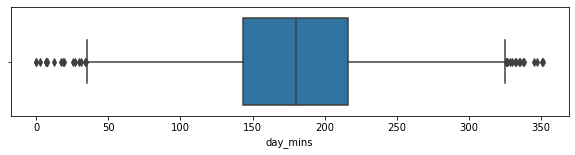

In [68]:
plt.figure(figsize=(10,2))
sns.boxplot(numeric_data.day_mins)

In [69]:
df1.day_mins.describe()

count    4969.000000
mean      180.306178
std        53.931206
min         0.000000
25%       143.700000
50%       180.100000
75%       216.200000
max       351.500000
Name: day_mins, dtype: float64

In [70]:
print(numeric_data.day_mins.quantile(0.99))

304.7599999999999


In [71]:
print('The number of rows whose values is greater than 304.6050 are:',len(numeric_data[numeric_data.day_mins>304.6050]))

The number of rows whose values is greater than 304.6050 are: 50


In [72]:
iqr = df1.day_mins.quantile(0.75) - df1.day_mins.quantile(0.25)
day_mins_outliers1 = df1.day_mins.quantile(0.75) + (iqr*1.5)
day_mins_outliers1

324.95

In [73]:
day_mins_outliers0 = df1.day_mins.quantile(0.25) - (iqr*1.5)
day_mins_outliers0

34.94999999999999

In [74]:
x = len(numeric_data.loc[(numeric_data['day_mins']< 34.94) | (numeric_data['day_mins']>324.95)])
print(x)

34


In [75]:
print('The no. of rows after outlier1 are:',len(numeric_data[numeric_data.day_mins>324.95]))

The no. of rows after outlier1 are: 17


### day_calls

C:\Users\sneha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='day_calls'>

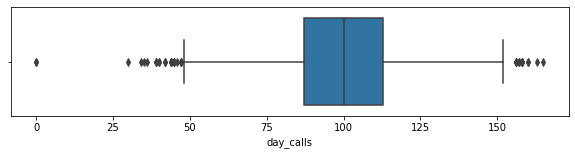

In [76]:
plt.figure(figsize = (10,2))
sns.boxplot(numeric_data.day_calls)

In [77]:
df1.day_calls.describe()

count    4969.000000
mean      100.021936
std        19.835965
min         0.000000
25%        87.000000
50%       100.000000
75%       113.000000
max       165.000000
Name: day_calls, dtype: float64

In [78]:
print(numeric_data.day_calls.quantile(0.99))

146.0


In [79]:
print('The number of rows whose value is greater than 146 are:',len(numeric_data[numeric_data.day_calls>146]))

The number of rows whose value is greater than 146 are: 45


In [80]:
iqr = df1.day_calls.quantile(0.75) - df1.day_calls.quantile(0.25)
day_calls_outliers1 = df1.day_calls.quantile(0.75) + (iqr*1.5)
day_calls_outliers1

152.0

In [81]:
day_calls_outliers0 = df1.day_calls.quantile(0.25) - (iqr*1.5)
day_calls_outliers0

48.0

In [82]:
x = len(numeric_data.loc[(numeric_data['day_calls']<48) | (numeric_data['day_calls']>152)])
print(x)

35


In [83]:
print('The no. of rows after outlier1 are:',len(numeric_data[numeric_data.day_calls>152]))

The no. of rows after outlier1 are: 12


### day_charge

C:\Users\sneha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='day_charge'>

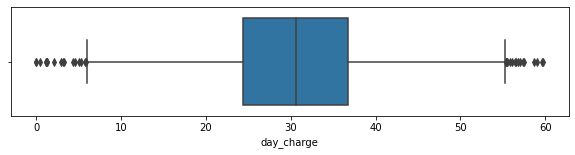

In [84]:
plt.figure(figsize=(10,2))
sns.boxplot(numeric_data.day_charge)

In [85]:
df1.day_charge.describe()

count    4969.000000
mean       30.652604
std         9.168275
min         0.000000
25%        24.430000
50%        30.620000
75%        36.750000
max        59.760000
Name: day_charge, dtype: float64

In [86]:
print(numeric_data.day_charge.quantile(0.99))

51.80879999999998


In [87]:
print('The number of rows whose value is greater than 51.7871 are:',len(numeric_data[numeric_data.day_charge>51.7871]))

The number of rows whose value is greater than 51.7871 are: 50


In [88]:
iqr = df1.day_charge.quantile(0.75) - df1.day_charge.quantile(0.25)
day_charge_outliers1 = df1.day_charge.quantile(0.75) + (iqr*1.5)
day_charge_outliers1

55.230000000000004

In [89]:
day_charge_outliers0 = df1.day_charge.quantile(0.25) - (iqr*1.5)
day_charge_outliers0

5.949999999999999

In [90]:
x = len(numeric_data.loc[(numeric_data['day_charge']<5.9499) | (numeric_data['day_charge']>55.23)])
print(x)

34


In [91]:
print('The no. of rows after outlier1 are:',len(numeric_data[numeric_data.day_charge>55.23]))

The no. of rows after outlier1 are: 17


### eve_mins

C:\Users\sneha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='eve_mins'>

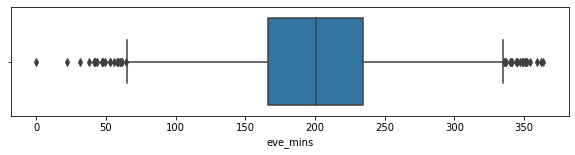

In [92]:
plt.figure(figsize = (10,2))
sns.boxplot(numeric_data.eve_mins)

In [93]:
df1.eve_mins.describe()

count    4969.000000
mean      200.617368
std        50.550590
min         0.000000
25%       166.400000
50%       201.000000
75%       234.100000
max       363.700000
Name: eve_mins, dtype: float64

In [94]:
print(numeric_data.eve_mins.quantile(0.99))

318.864


In [95]:
print('The number of rows whose value is greater than 318.85  are:',len(numeric_data[numeric_data.eve_mins>318.85]))

The number of rows whose value is greater than 318.85  are: 50


In [96]:
iqr = df1.eve_mins.quantile(0.75) - df1.eve_mins.quantile(0.25)
eve_mins_outliers1 = df1.eve_mins.quantile(0.75) + (iqr*1.5)
eve_mins_outliers1

335.65

In [97]:
eve_mins_outliers2 = df1.eve_mins.quantile(0.25) - (iqr*1.5)
eve_mins_outliers2

64.85000000000002

In [98]:
x = len(numeric_data.loc[(numeric_data['eve_mins']>335.65) | (numeric_data['eve_mins']<64.85)])
print(x)

43


### eve_calls

C:\Users\sneha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='eve_calls'>

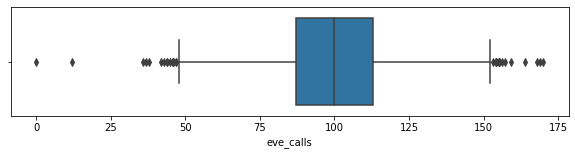

In [99]:
plt.figure(figsize = (10,2))
sns.boxplot(numeric_data.eve_calls)

In [100]:
df1.eve_calls.describe()

count    4969.000000
mean      100.174884
std        19.833572
min         0.000000
25%        87.000000
50%       100.000000
75%       113.000000
max       170.000000
Name: eve_calls, dtype: float64

In [101]:
print(numeric_data.eve_calls.quantile(0.99))

147.0


In [102]:
print('The number of rows whose value is greater than 147 are:',len(numeric_data[numeric_data.eve_calls>147]))

The number of rows whose value is greater than 147 are: 48


In [103]:
iqr = df1.eve_calls.quantile(0.75) - df1.eve_calls.quantile(0.25)
eve_calls_outliers1 = df1.eve_calls.quantile(0.75) + (iqr*1.5)
eve_calls_outliers1

152.0

In [104]:
eve_calls_outliers0 = df1.eve_calls.quantile(0.25) - (iqr*1.5)
eve_calls_outliers0

48.0

In [105]:
x = len(numeric_data.loc[(numeric_data['eve_calls']>152) | (numeric_data['eve_calls']<48)])
print(x)

34


In [106]:
print('The no. of rows after outlier1 are:',len(numeric_data[numeric_data.eve_calls>152]))

The no. of rows after outlier1 are: 17


### eve_charge

C:\Users\sneha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='eve_charge'>

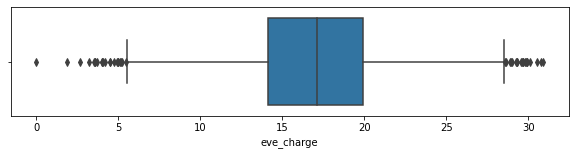

In [107]:
plt.figure(figsize = (10,2))
sns.boxplot(numeric_data.eve_charge)

In [108]:
df1.eve_charge.describe()

count    4969.000000
mean       17.052695
std         4.296784
min         0.000000
25%        14.140000
50%        17.090000
75%        19.900000
max        30.910000
Name: eve_charge, dtype: float64

In [109]:
print(numeric_data.eve_charge.quantile(0.99))

27.106399999999997


In [110]:
print('The number of rows whose value is greater than 27.1002 are:',len(numeric_data[numeric_data.eve_charge>27.1002]))

The number of rows whose value is greater than 27.1002 are: 50


In [111]:
iqr = df1.eve_charge.quantile(0.75) - df1.eve_charge.quantile(0.25)
eve_charge_outliers1 = df1.eve_charge.quantile(0.75) + (iqr*1.5)
eve_charge_outliers1

28.539999999999996

In [112]:
eve_charge_outliers0 = df1.eve_charge.quantile(0.25) - (iqr*1.5)
eve_charge_outliers0

5.5000000000000036

In [113]:
x = len(numeric_data.loc[(numeric_data['eve_charge']<5.5) | (numeric_data['eve_charge']>28.5399)])
print(x)

42


In [114]:
print('The no. of rows after outlier1 are:',len(numeric_data[numeric_data.eve_charge>28.53]))

The no. of rows after outlier1 are: 20


### night_mins

C:\Users\sneha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='night_mins'>

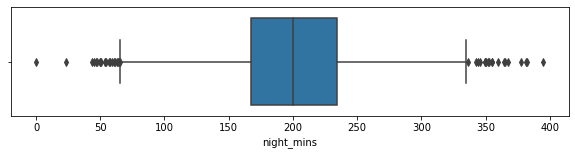

In [115]:
plt.figure(figsize = (10,2))
sns.boxplot(numeric_data.night_mins)

In [116]:
df1.night_mins.describe()

count    4969.000000
mean      200.434675
std        50.528158
min         0.000000
25%       167.100000
50%       200.400000
75%       234.700000
max       395.000000
Name: night_mins, dtype: float64

In [117]:
print(numeric_data.night_mins.quantile(0.99))

318.0959999999999


In [118]:
print('The number of rows whose value is greater than 318.00300  are:',len(numeric_data[numeric_data.night_mins>318.00300]))

The number of rows whose value is greater than 318.00300  are: 50


In [119]:
iqr = df1.night_mins.quantile(0.75) - df1.night_mins.quantile(0.25)
night_mins_outliers1 = df1.night_mins.quantile(0.75) + (iqr*1.5)
night_mins_outliers1

336.09999999999997

In [120]:
night_mins_outliers0 = df1.night_mins.quantile(0.25) - (iqr*1.5)
night_mins_outliers0

65.7

In [121]:
x = len(numeric_data.loc[(numeric_data['night_mins']<65.7) |(numeric_data['night_mins']>336.09)])
x

40

In [122]:
print('The no. of rows after outlier1 are:',len(numeric_data[numeric_data.night_mins>336.09]))

The no. of rows after outlier1 are: 19


### night_calls

C:\Users\sneha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='night_calls'>

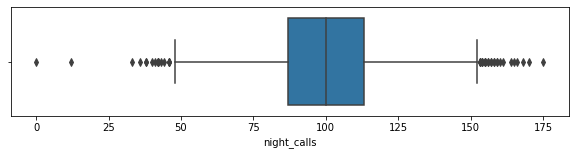

In [123]:
plt.figure(figsize = (10,2))
sns.boxplot(numeric_data.night_calls)

In [124]:
df1.night_calls.describe()

count    4969.000000
mean       99.954518
std        19.959015
min         0.000000
25%        87.000000
50%       100.000000
75%       113.000000
max       175.000000
Name: night_calls, dtype: float64

In [125]:
print(numeric_data.night_calls.quantile(0.99))

148.0


In [126]:
print('The number of rows whose value is greater than 148 are:',len(numeric_data[numeric_data.night_calls>148]))

The number of rows whose value is greater than 148 are: 46


In [127]:
iqr = df1.night_calls.quantile(0.75) - df1.night_calls.quantile(0.25)
night_calls_outliers1 = df1.night_calls.quantile(0.75) + (iqr*1.5)
night_calls_outliers1

152.0

In [128]:
night_calls_outliers0 = df1.night_calls.quantile(0.25) - (iqr*1.5)
night_calls_outliers0

48.0

In [129]:
x = len(numeric_data.loc[(numeric_data['night_calls']<48) |(numeric_data['night_calls']>152)])
x

43

In [130]:
print('The no. of rows after outlier1 are:',len(numeric_data[numeric_data.night_calls>152]))

The no. of rows after outlier1 are: 26


### night_charge

C:\Users\sneha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='night_charge'>

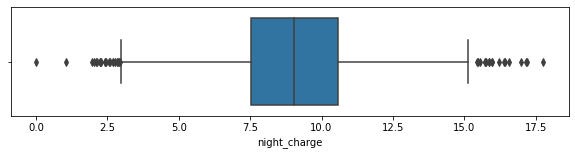

In [131]:
plt.figure(figsize = (10,2))
sns.boxplot(numeric_data.night_charge)

In [132]:
df1.night_charge.describe()

count    4969.000000
mean        9.019670
std         2.273776
min         0.000000
25%         7.520000
50%         9.020000
75%        10.560000
max        17.770000
Name: night_charge, dtype: float64

In [133]:
print(numeric_data.night_charge.quantile(0.99))

14.313199999999998


In [134]:
print('The number of rows whose value is greater than 14.3101  are:',len(numeric_data[numeric_data.night_charge>14.3101]))

The number of rows whose value is greater than 14.3101  are: 50


In [135]:
iqr = df1.night_charge.quantile(0.75) - df1.night_charge.quantile(0.25)
night_charge_outliers1 = df1.night_charge.quantile(0.75) + (iqr*1.5)
night_charge_outliers1

15.120000000000001

In [136]:
night_charge_outliers0 = df1.night_charge.quantile(0.25) - (iqr*1.5)
night_charge_outliers0

2.959999999999998

In [137]:
x = len(numeric_data.loc[(numeric_data['night_charge']<2.9599) |(numeric_data['night_charge']>15.12)])
x

39

In [138]:
print('The no. of rows after outlier1 are:',len(numeric_data[numeric_data.night_charge>15.12]))

The no. of rows after outlier1 are: 18


### customer_calls

C:\Users\sneha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='customer_calls'>

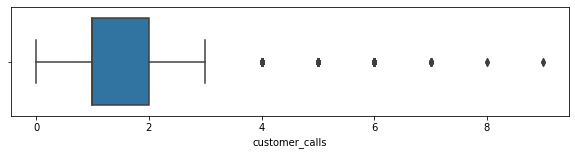

In [139]:
plt.figure(figsize = (10,2))
sns.boxplot(numeric_data.customer_calls)

In [140]:
df1.customer_calls.describe()

count    4969.000000
mean        1.571946
std         1.307458
min         0.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         9.000000
Name: customer_calls, dtype: float64

In [141]:
print(numeric_data.customer_calls.quantile(0.99))

6.0


In [142]:
print('The number of rows whose value is greater than 6 are:',len(numeric_data[numeric_data.customer_calls>6]))

The number of rows whose value is greater than 6 are: 17


In [143]:
iqr = df1.customer_calls.quantile(0.75) - df1.customer_calls.quantile(0.25)
customer_calls_outliers = df1.customer_calls.quantile(0.75) + (iqr*1.5)
customer_calls_outliers

3.5

In [144]:
print('The no. of rows after outlier1 are:',len(numeric_data[numeric_data.customer_calls>3.5]))

The no. of rows after outlier1 are: 398


### Visualisation of Numeric Columns

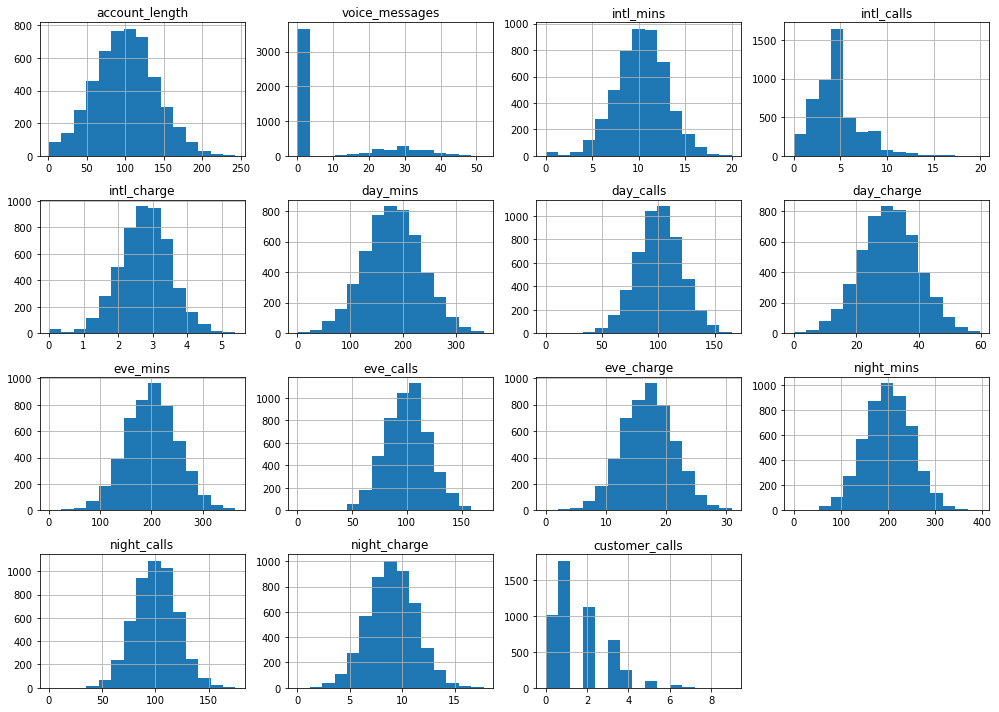

In [145]:
df1.select_dtypes(include=['float64','int64']).hist(bins=15, figsize=(14,10))
plt.tight_layout()
plt.show()

In [146]:
df1_nochurn = df1.loc[df1['churn']== 'no']
df1_churn = df1.loc[df1['churn']=='yes']

C:\Users\sneha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sneha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sneha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

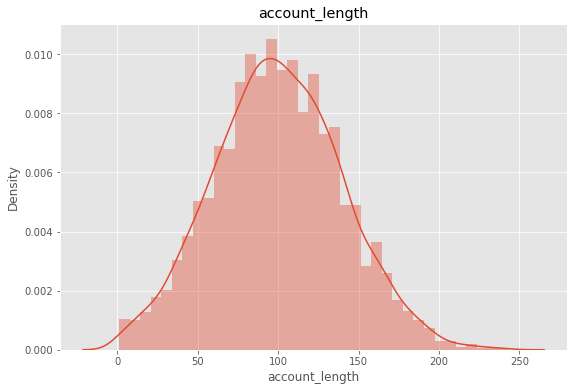

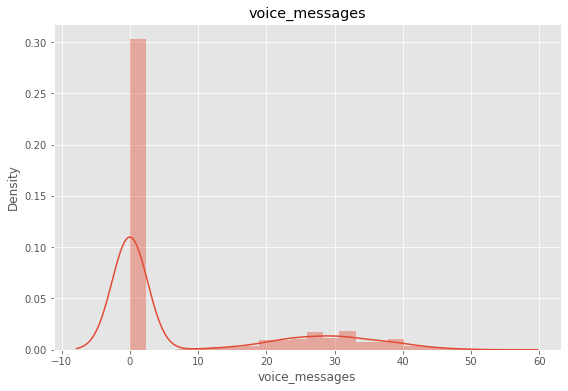

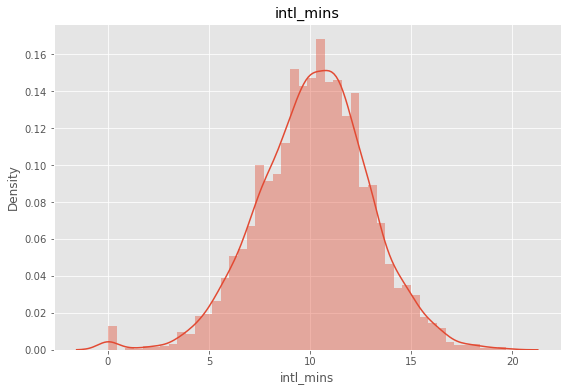

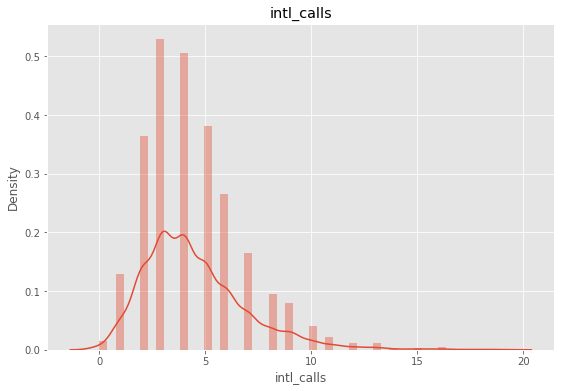

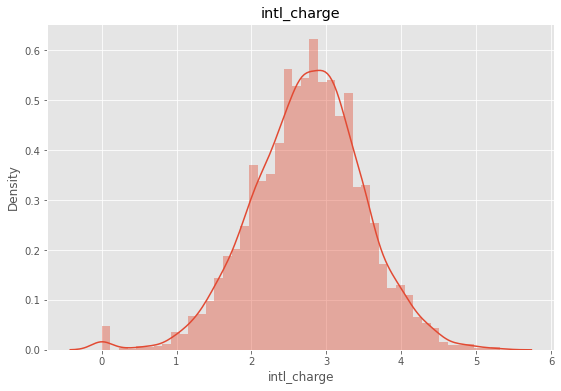

...

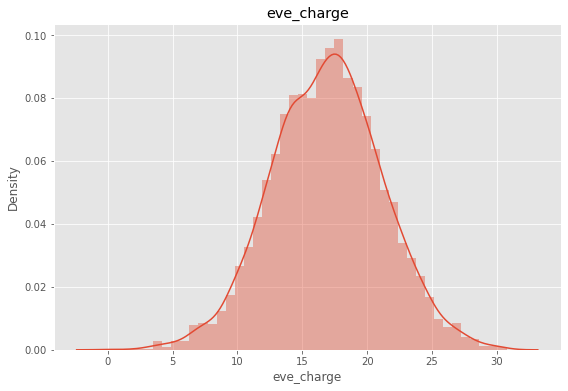

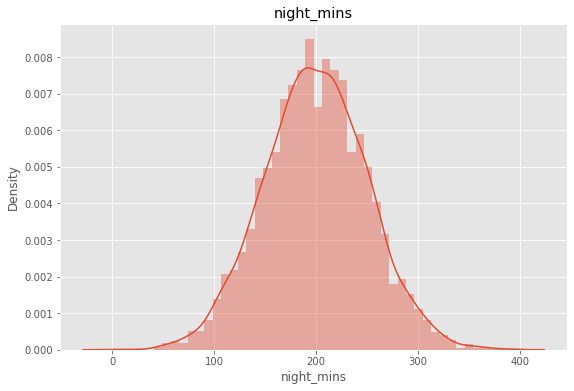

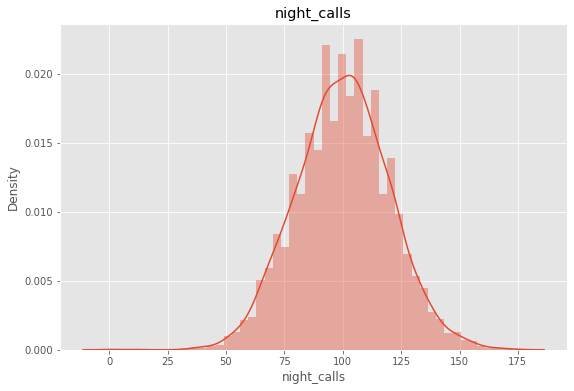

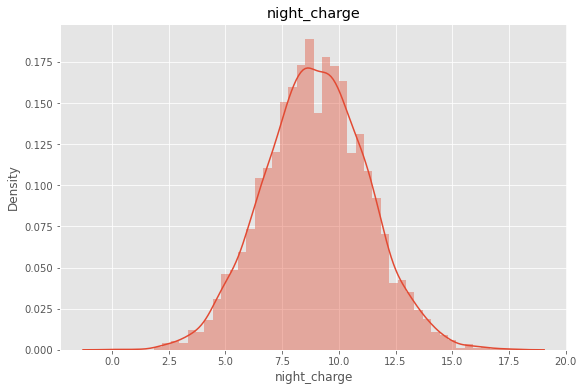

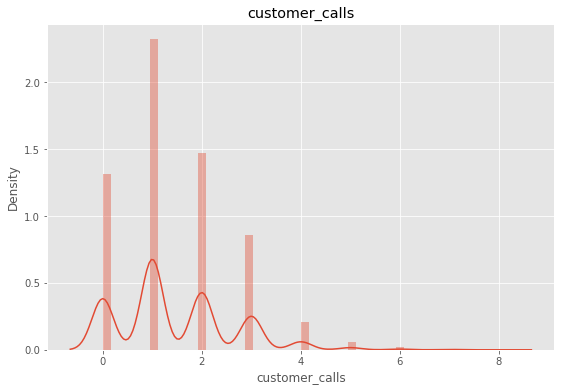

In [147]:
plt.style.use('ggplot')
for column in numeric_cols:
    plt.figure(figsize=(20,6))
    plt.subplot(121)
    sns.distplot(df1_nochurn[column])
    plt.title(column)
    

C:\Users\sneha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sneha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sneha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

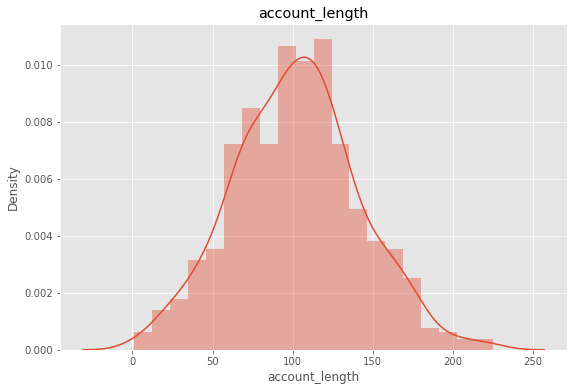

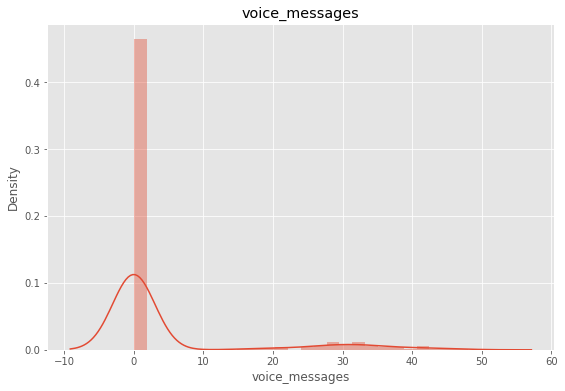

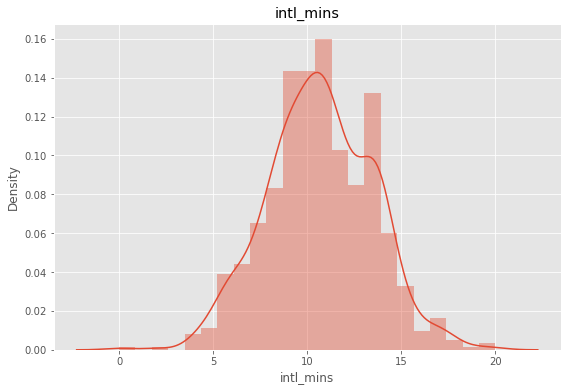

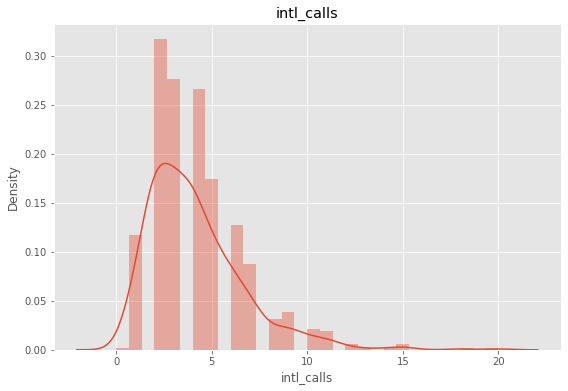

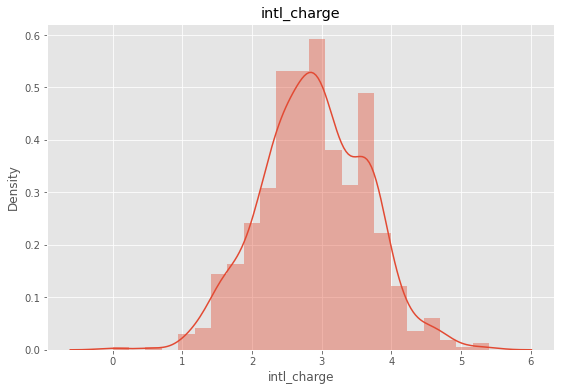

...

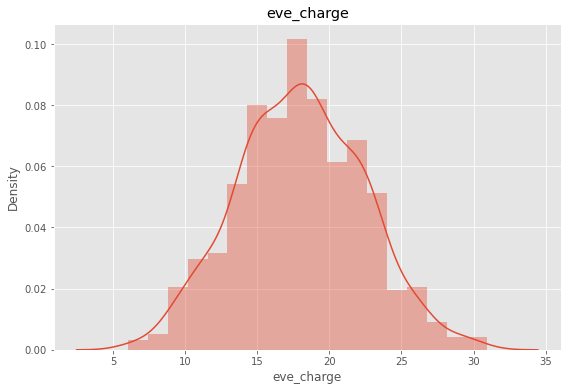

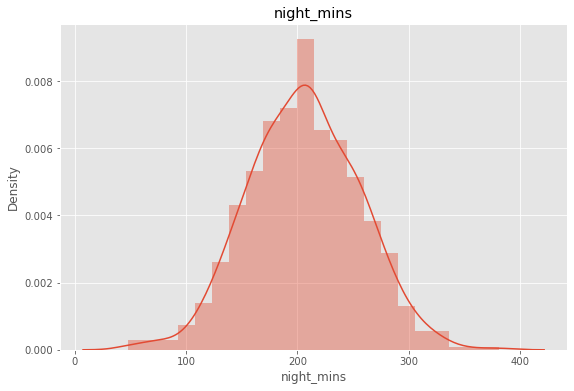

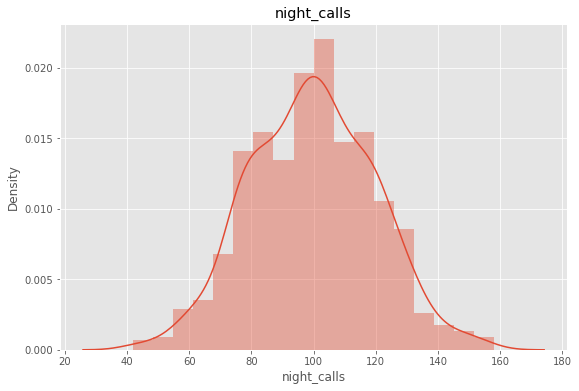

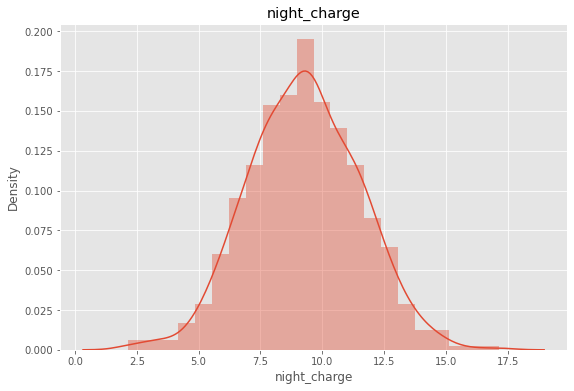

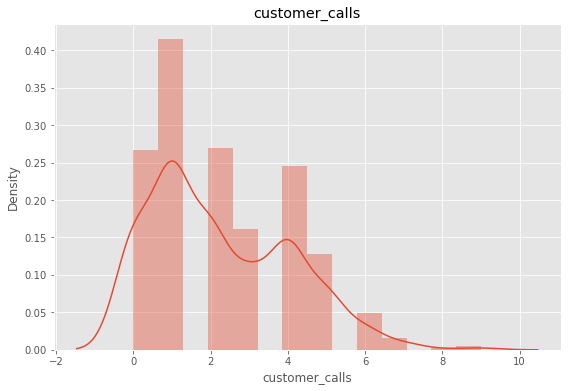

In [148]:
plt.style.use('ggplot')
for column in numeric_cols:
    plt.figure(figsize=(20,6))
    plt.subplot(121)
    sns.distplot(df1_churn[column])
    plt.title(column)
    

C:\Users\sneha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sneha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\sneha\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

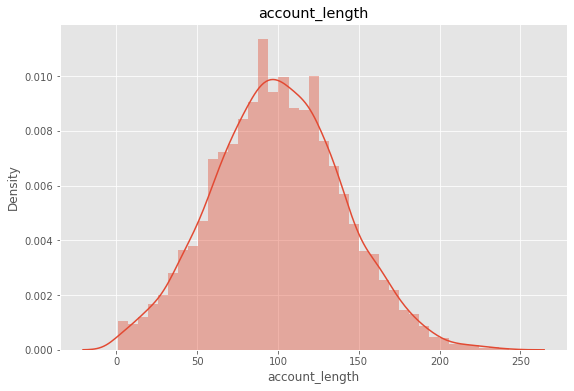

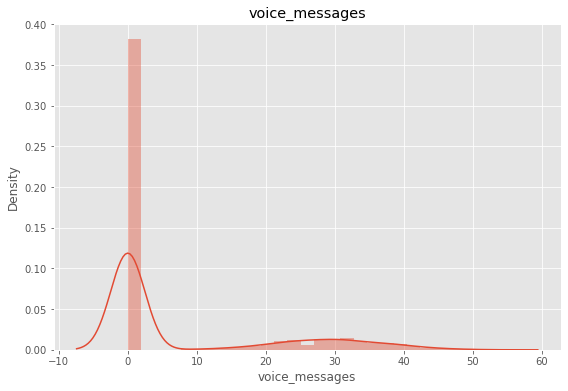

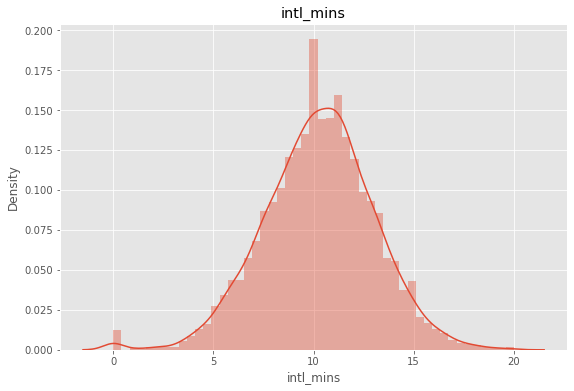

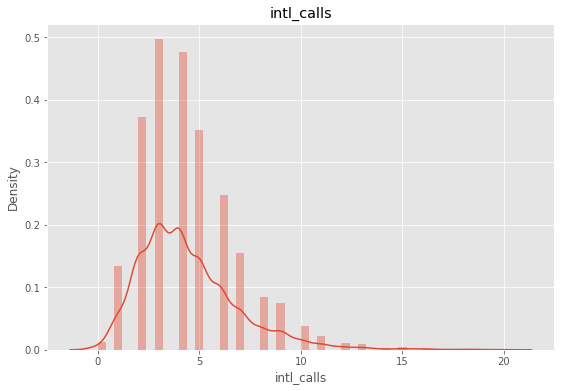

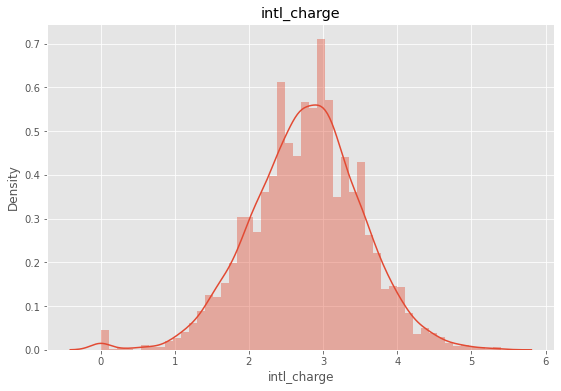

...

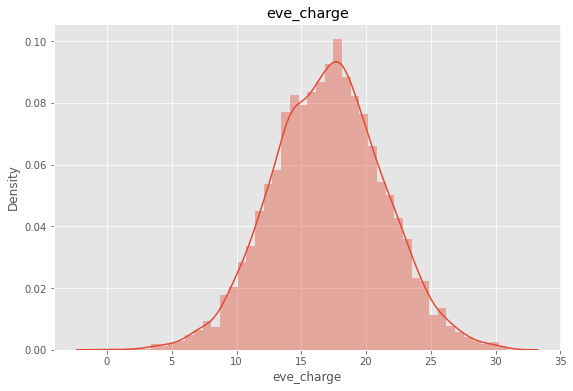

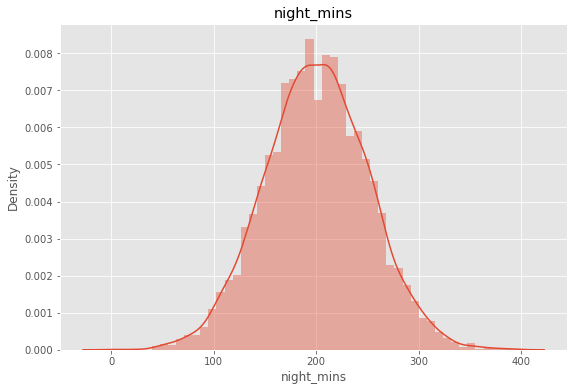

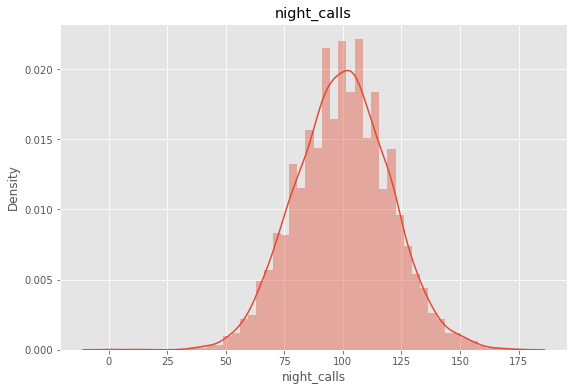

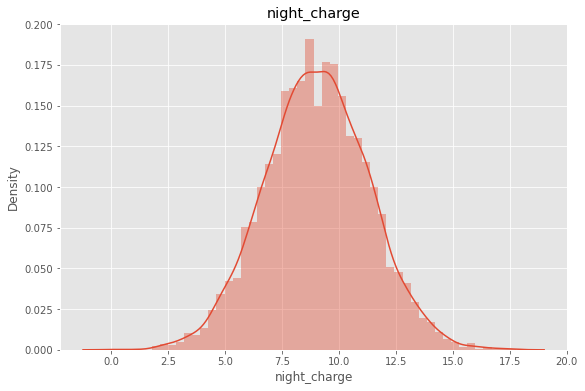

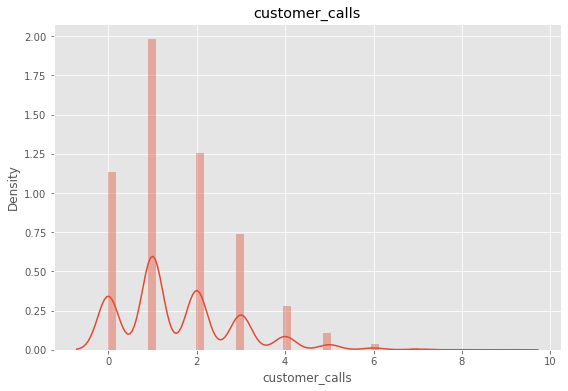

In [149]:
plt.style.use('ggplot')
for column in numeric_cols:
    plt.figure(figsize=(20,6))
    plt.subplot(121)
    sns.distplot(numeric_data[column])
    plt.title(column)

In [150]:
numeric_data.skew()

account_length    0.112468
voice_messages    1.350802
intl_mins        -0.208579
intl_calls        1.363577
intl_charge      -0.208885
day_mins         -0.012596
day_calls        -0.086277
day_charge       -0.012591
eve_mins         -0.013029
eve_calls        -0.019057
eve_charge       -0.013006
night_mins        0.017948
night_calls       0.001614
night_charge      0.017914
customer_calls    1.042828
dtype: float64

In [151]:
numeric_data.kurt()

account_length   -0.097761
voice_messages    0.200740
intl_mins         0.653211
intl_calls        3.275113
intl_charge       0.653835
day_mins         -0.020161
day_calls         0.185385
day_charge       -0.020032
eve_mins          0.053536
eve_calls         0.120130
eve_charge        0.053454
night_mins        0.088406
night_calls       0.150015
night_charge      0.088424
customer_calls    1.482168
dtype: float64

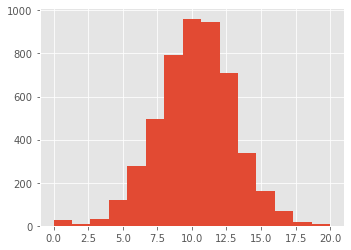

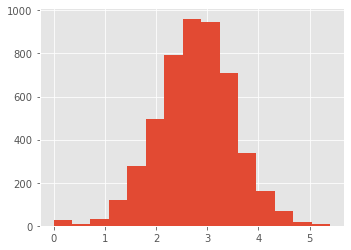

In [152]:
plt.subplot(1,2,1)
df1['intl_mins'].hist(bins=15, figsize = (12,4))
plt.show()

plt.subplot(1,2,2)
df1['intl_charge'].hist(bins=15, figsize = (12,4))
plt.show()

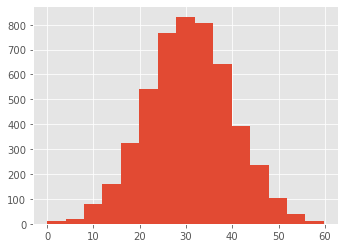

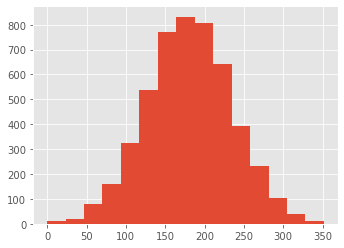

In [153]:
plt.subplot(1,2,1)
df1['day_charge'].hist(bins=15, figsize = (12,4))
plt.show()

plt.subplot(1,2,2)
df1['day_mins'].hist(bins=15, figsize = (12,4))
plt.show()

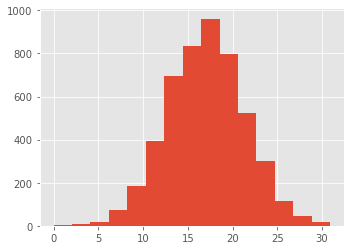

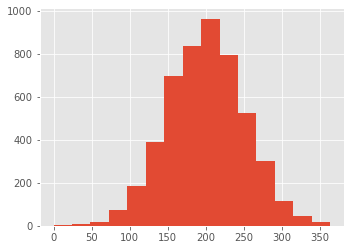

In [154]:
plt.subplot(1,2,1)
df1['eve_charge'].hist(bins=15, figsize = (12,4))
plt.show()

plt.subplot(1,2,2)
df1['eve_mins'].hist(bins=15, figsize = (12,4))
plt.show()

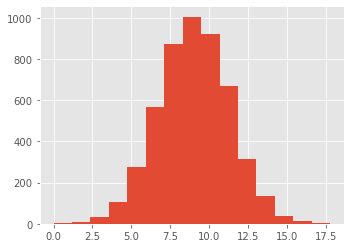

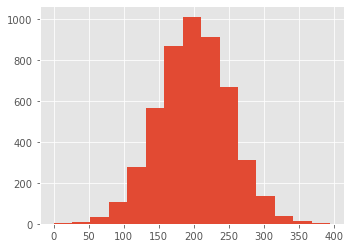

In [155]:
plt.subplot(1,2,1)
df1['night_charge'].hist(bins=15, figsize = (12,4))
plt.show()

plt.subplot(1,2,2)
df1['night_mins'].hist(bins=15, figsize = (12,4))
plt.show()

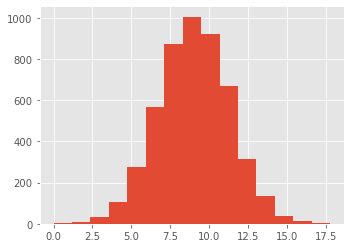

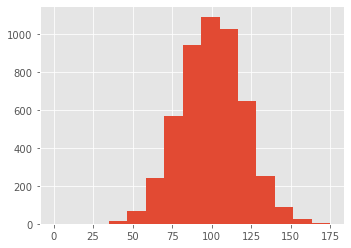

In [156]:
plt.subplot(1,2,1)
df1['night_charge'].hist(bins=15, figsize = (12,4))
plt.show()

plt.subplot(1,2,2)
df1['night_calls'].hist(bins=15, figsize = (12,4))
plt.show()

In [157]:
#These numeric varibale have same graph. they are highly correlated

### Analysis of Categoric Variable

In [158]:
categoric_data.describe().transpose()

,count,unique,top,freq
state,4969,51,WV,158
area_code,4969,3,area_code_415,2479
voice_plan,4969,2,no,3654
intl_plan,4969,2,no,4499
churn,4969,2,no,4264


In [159]:
df1['state'].value_counts().head()

WV    158
MN    124
AL    123
ID    119
VA    117
Name: state, dtype: int64

In [160]:
df1['area_code'].value_counts()

area_code_415    2479
area_code_408    1249
area_code_510    1241
Name: area_code, dtype: int64

In [161]:
df1['voice_plan'].value_counts()

no     3654
yes    1315
Name: voice_plan, dtype: int64

In [162]:
df1['intl_plan'].value_counts()

no     4499
yes     470
Name: intl_plan, dtype: int64

In [163]:
df1['churn'].value_counts()

no     4264
yes     705
Name: churn, dtype: int64

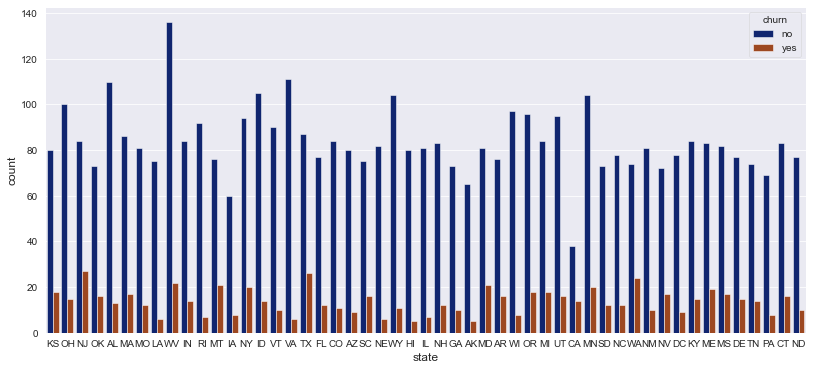

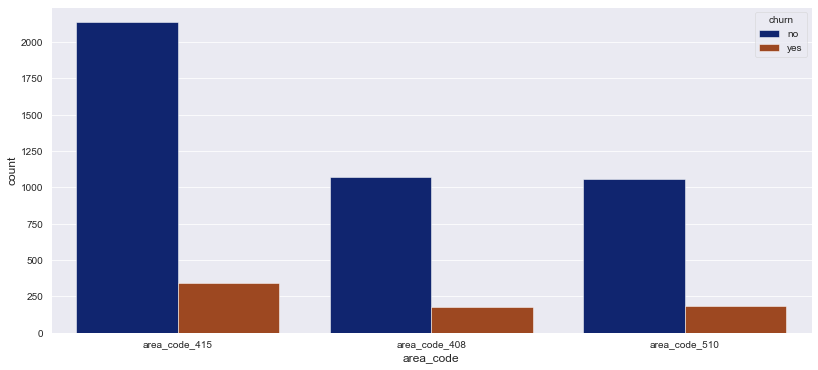

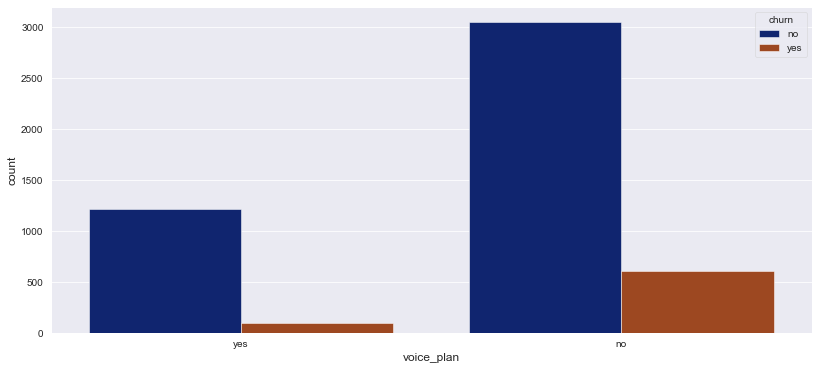

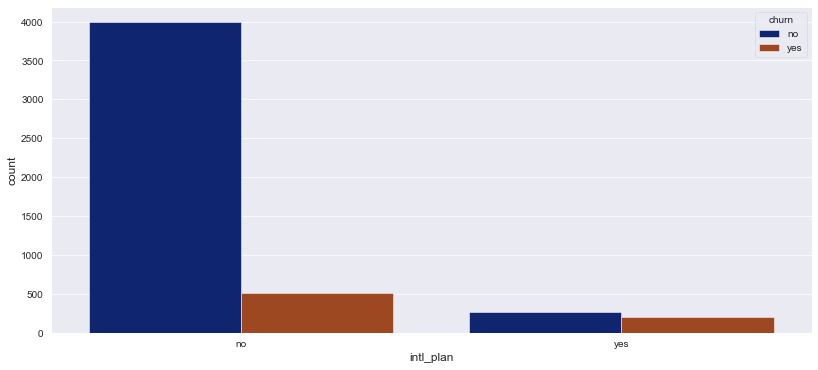

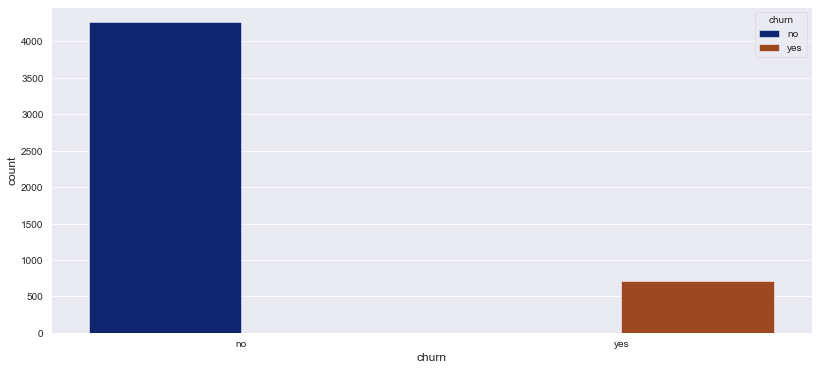

In [164]:
plt.style.use('ggplot')
sns.set_style("darkgrid")
for column in categoric_cols:
    plt.figure(figsize=(30,6))
    plt.subplot(121)
    sns.countplot(x=column,hue='churn',data=df1,palette='dark')
    plt.show()
    

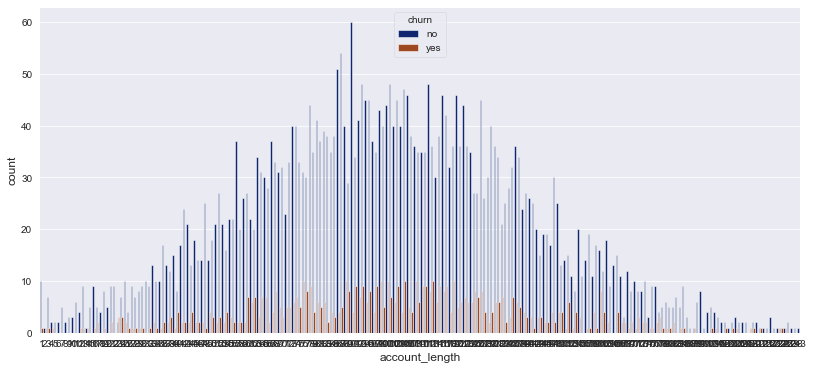

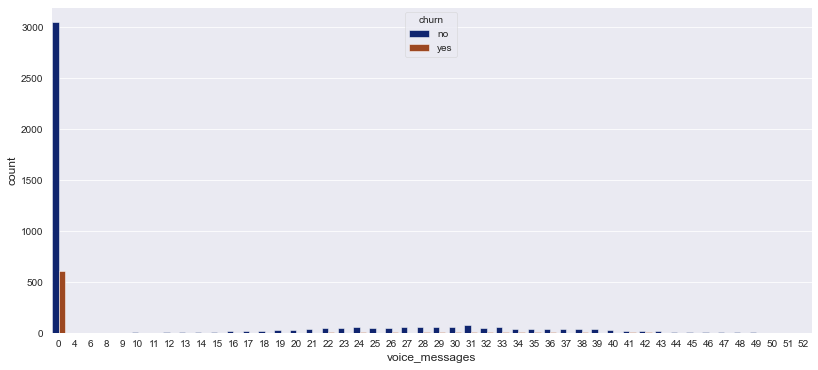

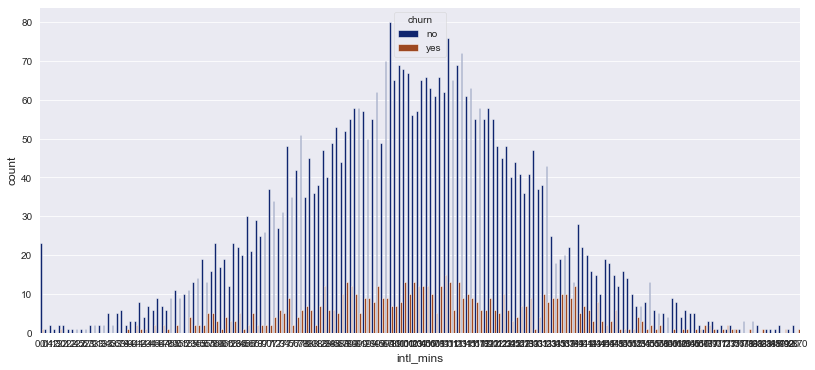

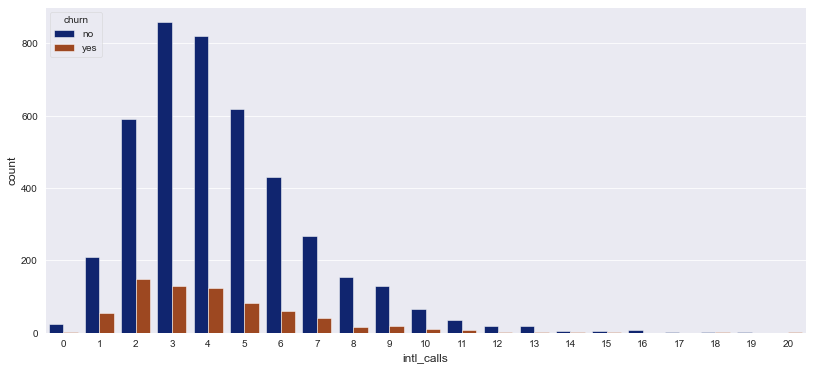

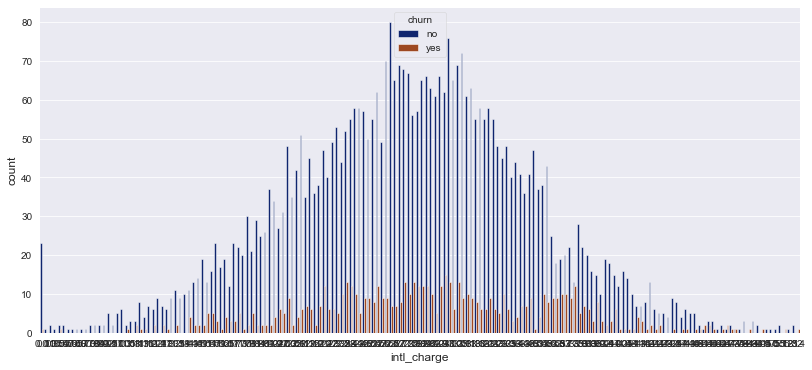

...

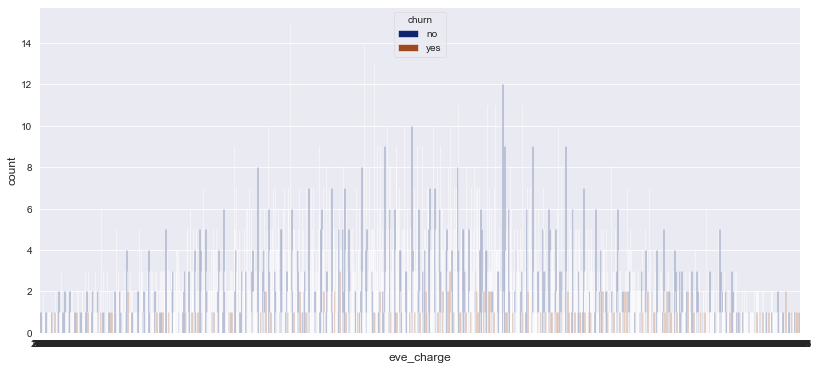

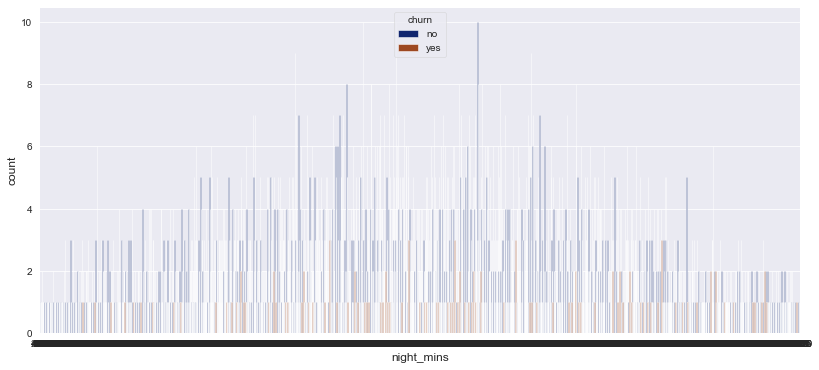

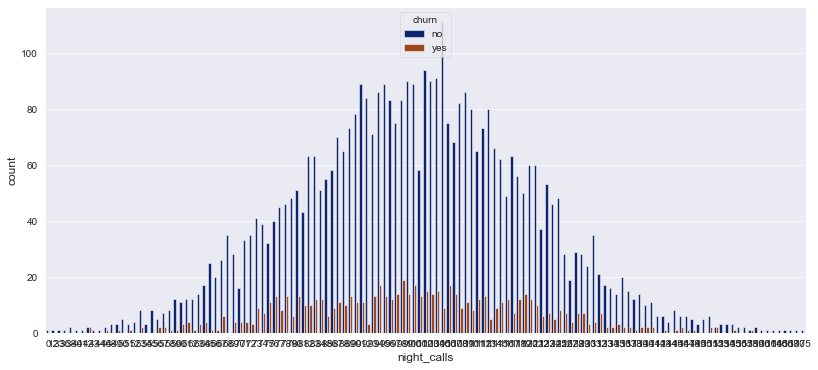

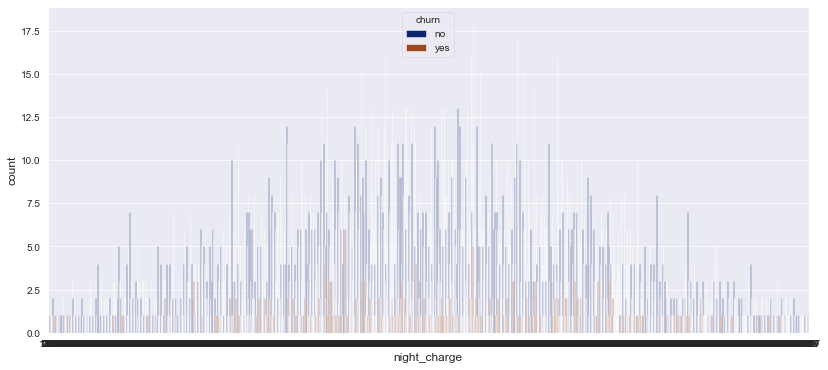

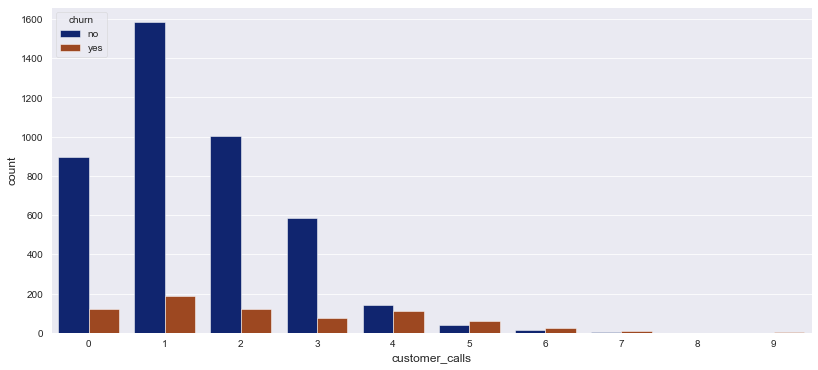

In [165]:
plt.style.use('ggplot')
sns.set_style("darkgrid")
for column in numeric_cols:
    plt.figure(figsize=(30,6))
    plt.subplot(121)
    sns.countplot(x=column,hue='churn',data=df1,palette='dark')
    plt.show()

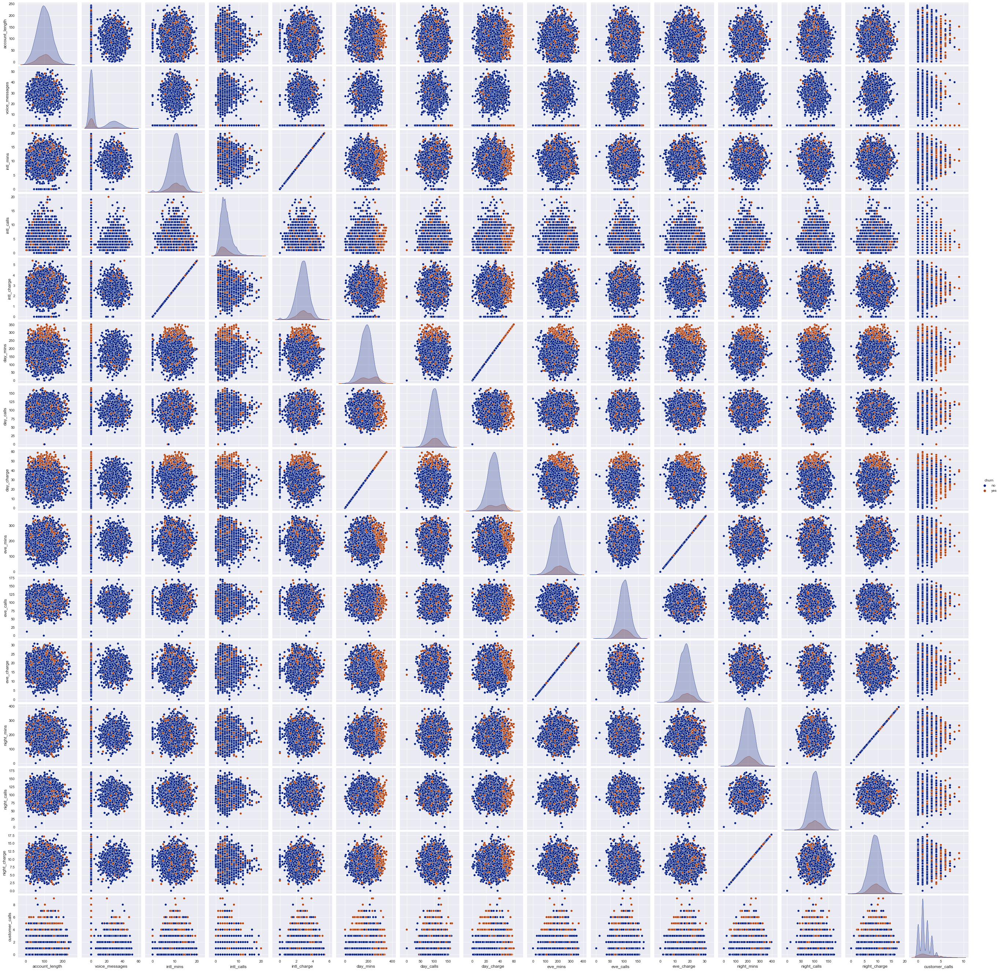

In [166]:
sns.pairplot(data=df1,hue='churn',palette='dark')
plt.show()

### Now encoding categoric variables 

In [167]:
categoric_data.head(5)

,state,area_code,voice_plan,intl_plan,churn
0,KS,area_code_415,yes,no,no
1,OH,area_code_415,yes,no,no
2,NJ,area_code_415,no,no,no
3,OH,area_code_408,no,yes,no
4,OK,area_code_415,no,yes,no


In [168]:
#df2 = pd.get_dummies(df1,columns=['state','area_code'])

In [169]:
df2 = pd.get_dummies(df1,columns = ['state','area_code'])

In [170]:
#df2 = df2.drop(['state'],axis =1)

In [171]:
df2.head(5)

,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,intl_charge,day_mins,day_calls,day_charge,...,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY,area_code_area_code_408,area_code_area_code_415,area_code_area_code_510
0,128,yes,25,no,10.0,3,2.70,265.1,110,45.07,...,0,0,0,0,0,0,0,0,1,0
1,107,yes,26,no,13.7,3,3.70,161.6,123,27.47,...,0,0,0,0,0,0,0,0,1,0
2,137,no,0,no,12.2,5,3.29,243.4,114,41.38,...,0,0,0,0,0,0,0,0,1,0
3,84,no,0,yes,6.6,7,1.78,299.4,71,50.90,...,0,0,0,0,0,0,0,1,0,0
4,75,no,0,yes,10.1,3,2.73,166.7,113,28.34,...,0,0,0,0,0,0,0,0,1,0


## Modal Building!

In [172]:
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import recall_score
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from imblearn.combine import SMOTEENN
from sklearn.metrics import roc_curve,auc

In [173]:
df2 = df2.drop(['intl_charge','day_charge','night_charge','eve_charge'],axis = 1)

In [174]:
df2.replace('yes',1,inplace=True)
df2.replace('no',0,inplace=True)

In [175]:
x = df2.drop('churn',axis=1)
x.head(5)

,account_length,voice_plan,voice_messages,intl_plan,intl_mins,intl_calls,day_mins,day_calls,eve_mins,eve_calls,...,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY,area_code_area_code_408,area_code_area_code_415,area_code_area_code_510
0,128,1,25,0,10.0,3,265.1,110,197.4,99,...,0,0,0,0,0,0,0,0,1,0
1,107,1,26,0,13.7,3,161.6,123,195.5,103,...,0,0,0,0,0,0,0,0,1,0
2,137,0,0,0,12.2,5,243.4,114,121.2,110,...,0,0,0,0,0,0,0,0,1,0
3,84,0,0,1,6.6,7,299.4,71,61.9,88,...,0,0,0,0,0,0,0,1,0,0
4,75,0,0,1,10.1,3,166.7,113,148.3,122,...,0,0,0,0,0,0,0,0,1,0


In [176]:
y = df2['churn']
y.head(5)

0    0
1    0
2    0
3    0
4    0
Name: churn, dtype: int64

In [177]:
df2.shape

(4969, 68)

#### Train Test Split

In [178]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3)
y_train.value_counts()

0    2983
1     495
Name: churn, dtype: int64

In [179]:
print("Percentage of Churned:",49100/2987)

Percentage of Churned: 16.43789755607633


In [180]:
y_test.value_counts()

0    1281
1     210
Name: churn, dtype: int64

In [181]:
print("Percentage of Churned:",21400/1277)

Percentage of Churned: 16.758026624902115


#### SMOTE

In [182]:
sm = SMOTEENN()    #oversampling
x_train_res , y_train_res = sm.fit_resample(x_train,y_train)
y_train_res.value_counts()

1    2822
0    1706
Name: churn, dtype: int64

### Decision Tree Classifier

In [183]:
model_DT = DecisionTreeClassifier(criterion="gini",random_state=42,max_depth = 11, min_samples_leaf = 12)

In [184]:
model_DT.fit(x_train_res , y_train_res)
y_predict = model_DT.predict(x_test)
model_rscore = model_DT.score(x_train_res , y_train_res)
model_rscore
print(classification_report(y_test,y_predict))

              precision    recall  f1-score   support

           0       0.95      0.90      0.93      1281
           1       0.55      0.72      0.63       210

    accuracy                           0.88      1491
   macro avg       0.75      0.81      0.78      1491
weighted avg       0.90      0.88      0.89      1491



In [185]:
confusion_matrix = confusion_matrix(y_test,y_predict)
print(confusion_matrix)#check there is imbalance in fp and fn

[[1159  122]
 [  58  152]]


<AxesSubplot:>

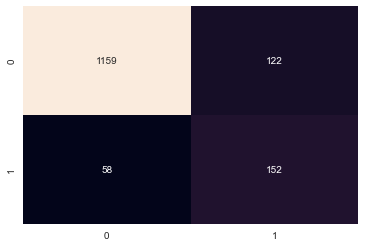

In [186]:
sns.heatmap(confusion_matrix, annot=True, fmt = 'd', cbar = False)

In [187]:
model_DT.score(x_train_res , y_train_res) #training accuracy

0.9335247349823321

In [188]:
model_DT.score(x_test,y_test)              #testing accuracy

0.8792756539235412

Text(0, 0.5, 'True Positive Rate')

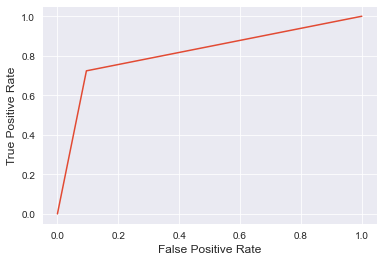

In [189]:
fpr,tpr,thresholds = roc_curve(y_test,y_predict)
plt.plot(fpr, tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

##### Accuracy is 87% is Decision Tree Classifier

### PCA

In [292]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier

In [297]:
pca = PCA(0.95)

In [301]:
x_pca.shape

(4969, 61)

In [316]:
x_train_resPCA = pca.fit_transform(x_train_res)

In [306]:
x_test_pca = pca.transform(x_test)

In [317]:
model_pcaRF = RandomForestClassifier(n_estimators=100,criterion='gini',random_state=100,max_depth=6,min_samples_leaf=12)

In [318]:
model_pcaRF.fit(x_train_resPCA,y_train_res)

RandomForestClassifier(max_depth=6, min_samples_leaf=12, random_state=100)

In [319]:
y_predictpcaRF = model_pcaRF.predict(x_test_pca )

In [320]:
model_pcaRF.score(x_train_resPCA,y_train_res)             #Training accuracy

0.7992491166077739

In [321]:
model_pcaRF.score(x_test_pca ,y_test)                  #Testing accuracy

0.6217303822937625

In [322]:
print(metrics.classification_report(y_test,y_predictpcaRF))

              precision    recall  f1-score   support

           0       0.92      0.62      0.74      1281
           1       0.22      0.66      0.33       210

    accuracy                           0.62      1491
   macro avg       0.57      0.64      0.53      1491
weighted avg       0.82      0.62      0.68      1491



In [323]:
confusion_matrixpcaRF = metrics.confusion_matrix(y_test,y_predictpcaRF)
print(confusion_matrixpcaRF)

[[789 492]
 [ 72 138]]


<AxesSubplot:>

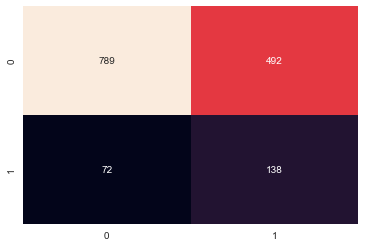

In [291]:
sns.heatmap(confusion_matrixpcaRF, annot=True, fmt = 'd', cbar = False)

##### Accuracy:62% which is very very less. using pca in Random Forest

### Random Forest Classifier

In [211]:
from sklearn.ensemble import RandomForestClassifier

In [212]:
model_RF = RandomForestClassifier(n_estimators=105,criterion='gini',random_state=100,max_depth=11,min_samples_leaf=11)

In [213]:
model_RF.fit(x_train_res , y_train_res)

RandomForestClassifier(max_depth=11, min_samples_leaf=11, n_estimators=105,
                       random_state=100)

In [214]:
y_predictRF = model_RF.predict(x_test)

In [215]:
model_scoreRF = model_RF.score(x_train_res , y_train_res) #training accuracy
model_scoreRF

0.9293286219081273

In [216]:
model_RF.score(x_test,y_test)              #testing accuracy

0.8101945003353455

In [217]:
print(classification_report(y_test,y_predictRF))

              precision    recall  f1-score   support

           0       0.95      0.82      0.88      1281
           1       0.41      0.75      0.53       210

    accuracy                           0.81      1491
   macro avg       0.68      0.78      0.70      1491
weighted avg       0.88      0.81      0.83      1491



In [218]:
confusion_matrixRF = metrics.confusion_matrix(y_test,y_predictRF)
print(confusion_matrixRF)

[[1051  230]
 [  53  157]]


<AxesSubplot:>

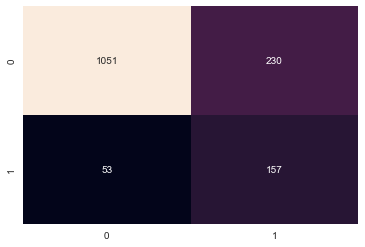

In [219]:
sns.heatmap(confusion_matrixRF, annot=True, fmt = 'd', cbar = False)

#### Accuracy using Random Forest Alone is 81%

### XGBOOST Classifier

In [220]:
from xgboost import XGBClassifier
import lightgbm as lgb
model_XGB = XGBClassifier(n_estimator = 50, max_depth = 20,learning_rate = 0.5)
model_XGB.fit(x_train_res,y_train_res)

[12:55:23] WARNING: C:/buildkite-agent/builds/buildkite-windows-cpu-autoscaling-group-i-03de431ba26204c4d-1/xgboost/xgboost-ci-windows/src/learner.cc:767: 
Parameters: { "n_estimator" } are not used.



XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.5, max_bin=256,
              max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
              max_depth=20, max_leaves=0, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimator=50, n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', ...)

In [221]:
y_predictXGB = model_XGB.predict(x_test)

In [222]:
model_scoreXGB = model_XGB.score(x_train_res , y_train_res) #training accuracy
model_scoreXGB

1.0

In [223]:
model_XGB.score(x_test,y_test)                                #Testing accuracy

0.9235412474849095

In [224]:
print(classification_report(y_test,y_predictXGB))

              precision    recall  f1-score   support

           0       0.97      0.94      0.95      1281
           1       0.70      0.80      0.75       210

    accuracy                           0.92      1491
   macro avg       0.83      0.87      0.85      1491
weighted avg       0.93      0.92      0.93      1491



In [225]:
confusion_matrixXGB = metrics.confusion_matrix(y_test,y_predictXGB)
print(confusion_matrixXGB)

[[1209   72]
 [  42  168]]


<AxesSubplot:>

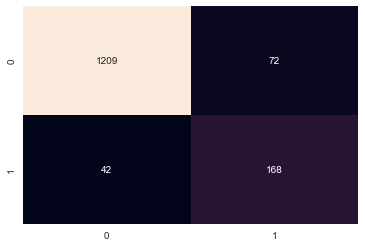

In [226]:
sns.heatmap(confusion_matrixXGB, annot=True, fmt = 'd', cbar = False)

### Accuracy using XGBoost is 92%

### Logistic Regression

In [227]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix,roc_curve,roc_auc_score

In [228]:
model_LogR = LogisticRegression()
model_LogR.fit(x_train_res,y_train_res)

C:\Users\sneha\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [229]:
model_LogR.coef_

array([[-5.00600335e-04, -1.07933896e-01, -2.76717186e-02,
         7.22518791e-02,  2.99007213e-02, -1.59317829e-01,
         1.05134217e-02, -4.12627537e-03,  3.07657902e-03,
        -1.60891642e-02,  3.71996243e-04, -2.92303246e-03,
         5.15926570e-01, -1.74718032e-02, -3.29710028e-02,
        -1.34774180e-02, -1.59320498e-02, -6.56363028e-03,
        -1.77383881e-02, -1.90038641e-02, -1.84995967e-02,
        -1.19895794e-02, -1.32223279e-02, -2.06853980e-02,
        -1.85014575e-02, -1.39827247e-02, -2.34381336e-02,
        -1.59980936e-02, -2.43104103e-02, -1.73008710e-02,
        -1.95024773e-02, -1.53001869e-02, -1.94759231e-02,
        -1.54494889e-02, -1.68161117e-02, -1.45276926e-02,
        -2.17716615e-02, -2.08241891e-02, -1.47323328e-02,
        -8.81176203e-03, -1.68760372e-02, -1.82065940e-02,
        -2.21990094e-02, -1.81531468e-02, -2.04770155e-02,
        -1.85573608e-02, -1.20875126e-02, -1.32796175e-02,
        -2.42761682e-02, -1.35219109e-02, -1.34273117e-0

In [230]:
model_LogR.intercept_

array([-0.02681283])

In [231]:
y_predictLogR = model_LogR.predict(x_test)

In [232]:
model_scoreLogR =  model_LogR.score(x_train_res , y_train_res)  #training accuracy
model_scoreLogR 

0.7318904593639576

In [233]:
model_LogR.score(x_test , y_test)        #Testing accuracy

0.5264922870556673

In [234]:
print(classification_report(y_test,y_predictLogR))

              precision    recall  f1-score   support

           0       0.95      0.48      0.63      1281
           1       0.21      0.84      0.33       210

    accuracy                           0.53      1491
   macro avg       0.58      0.66      0.48      1491
weighted avg       0.84      0.53      0.59      1491



In [235]:
confusion_matrixLR = confusion_matrix(y_test,y_predictLogR)
print(confusion_matrixLR)

[[609 672]
 [ 34 176]]


<AxesSubplot:>

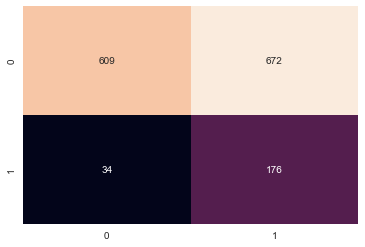

In [236]:
sns.heatmap(confusion_matrixLR, annot=True, fmt = 'd', cbar = False)

In [237]:
auc = roc_auc_score(y_test,y_predictLogR)
auc

0.6567525370804059

#### Accuracy using Logistic Regression is 53% ,  quite low

### Support Vector Machine

In [238]:
from sklearn.svm import SVC

In [239]:
model_SVC = SVC(C=200,gamma=0.00001)
model_SVC.fit(x_train_res,y_train_res)

SVC(C=200, gamma=1e-05)

In [240]:
y_predictSVC = model_SVC.predict(x_test)

In [241]:
model_scoreSVC =  model_SVC.score(x_train_res , y_train_res)  #training accuracy
model_scoreSVC

0.9006183745583038

In [242]:
model_SVC.score(x_test , y_test)        #Testing accuracy

0.7551978537894031

In [243]:
print(classification_report(y_test,y_predictSVC))

              precision    recall  f1-score   support

           0       0.95      0.76      0.84      1281
           1       0.33      0.73      0.46       210

    accuracy                           0.76      1491
   macro avg       0.64      0.75      0.65      1491
weighted avg       0.86      0.76      0.79      1491



In [244]:
confusion_matrixSVC = metrics.confusion_matrix(y_test,y_predictSVC)
print(confusion_matrixSVC)

[[972 309]
 [ 56 154]]


<AxesSubplot:>

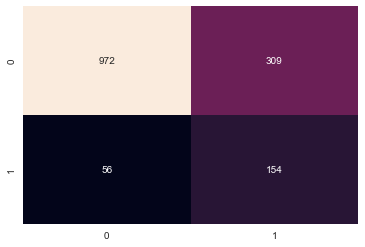

In [245]:
sns.heatmap(confusion_matrixSVC, annot=True, fmt = 'd', cbar = False)

#### Using Support vector machine we got the accuracy of 76%